In [399]:
!pip install --upgrade cvxpy

Defaulting to user installation because normal site-packages is not writeable


In [401]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import os

In [402]:
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"


tkwargs = {
    "dtype": torch.double,
    #"device": torch.device("cuda" if torch.cuda.is_available() else "cpu"),
}
SMOKE_TEST = os.environ.get("SMOKE_TEST")

from __future__ import annotations

import math
from abc import ABC, abstractmethod
from math import pi
from typing import Optional

from botorch.test_functions.base import (
    ConstrainedBaseTestProblem,
    MultiObjectiveTestProblem,
)

In [403]:
from botorch import fit_gpytorch_model
from botorch.sampling import SobolQMCNormalSampler
from botorch.exceptions import BadInitialCandidatesWarning
from botorch.utils.multi_objective.pareto import is_non_dominated
from botorch.utils.multi_objective.box_decompositions.non_dominated import FastNondominatedPartitioning

import time
import warnings

In [404]:
#dataset macronutrients and micronutrients and others.

#Costs of raws
Costos=torch.tensor([141.24,144.24,147.25,132.22,132.22,195.32,342.57,120.2,30.05,1803.03,111.18,336.56,152.65,150.25,159.27,136.73,300.5])
#CF
CF=torch.tensor([4.5,2.8,2.5,24.7,6.1,5.6,1,8,0,0,22.5,0,17.8,14.5,5.7,2.3,0])
#Ca
Ca=torch.tensor([0.06,0.04, 0.02, 1.75, 0.24,0.29,4.50,0.16,38.3,0.04, 0.35, 0, 0.98, 0.23, 0.10, 0.05, 32])
#AP
AP=torch.tensor([0.13, 0.18, 0.05, 0.26, 0.03, 0.19, 2.45, 0.22, 0,0,0.17, 0, 0.04, 0.13, 0.15, 0.15,0])
#DM
DM=torch.tensor([90.2,89.4, 86.3,91.2, 88.8, 88, 92, 88.6, 98, 98.5, 89.3, 0, 89.7, 90.8, 86.7, 89.4, 99.4])
#CP
CP=torch.tensor([11.3, 11.6, 7.7, 16.7, 2.5, 44, 62.4, 19, 0, 95, 30.5, 0, 10.1,30.7, 21.5, 8.9, 0])
#Energy
Energy=torch.tensor([14.7446, 15.4048, 14.9983,5.7664, 10.9456,15.3092,14.4188,12.5758,0,16.4095,9.9224,17.37,7.9859,  14.363 ,  14.4828,  15.2728, 0])
#L
L=torch.tensor([0.4,0.33,0.22, 0.73, 0.09, 2.88, 4.75, 0.62, 0, 78, 1.06, 0, 0.59, 1.46, 1.55, 0.34, 0])
#MC
MC=torch.tensor([0.43,0.46,0.33,0.45,0.06,1.28,2.36,0.83,0,0,1.25,0,0.22,0.66,0.56,0.37,0])
#T
T=torch.tensor([0.37,0.34,0.27,0.7,0.07,1.75,2.65,0.74,0,0,1.06,0,0.47,0.99,0.82,0.3,0])
#Tp
Tp=torch.tensor([0.13,0.13,0.06,0.31,0.02,0.59,0.65,0.13,0,0,0.43,0,0.1,0.25,0.19,0.1,0])
#P
P=torch.tensor([0.36, 0.35, 0.27, 0.3, 0.1, 0.61, 2.77, 0.8, 0.02,0, 1, 0, 0.11, 0.32, 0.40, 0.34,18])


#Bounds of raws and macronutrients
supbd=10

bound=torch.tensor([0.4, 0.4, 0.4, 0.05, 0.22, 1,0.04, 0.08,1,0.0065, 0.06, 0.04, 0.05, 0.1, 0.15, 0.2, 1])
Q=torch.concatenate([CF, Ca, AP, DM, CP, MC, T, Tp, Energy, L]).reshape(10,17)
lower=torch.tensor([0, 0.6, 0.23, 87, 18, 0.475, 0.627, 0.171, 14.1, 0.95001])
upper=torch.tensor([6, supbd, supbd, 95, 21, supbd,supbd, supbd, 20,2])
Q1=torch.concatenate([CF, Ca, AP, P, DM, CP, MC, T, Tp, Energy, L]).reshape(11,17)

#number of variables and standard deviation, and variances
n=17

ones=torch.ones(n)

stdl = torch.tensor([0.03962323, 0.0484768 , 0.01870829, 0.08031189, 0.02408319,0.13823892, 0.54625086, 0.09300538, 0., 0.,0.06356099, 0. , 0.08848729, 0.08757854, 0.06511528,0.03 , 0. ])
stde=torch.tensor([0.3197, 0.4066, 0.2644, 1.0968, 0.5168, 0.3607, 1.4353, 0.5676,0.    , 0.    , 0.7056, 0.    , 1.4691, 0.5844, 0.3746, 0.2462,0.    ])

vare=torch.diag(stde**2)
varl=torch.diag(stdl**2)

In [405]:
class myfunction(MultiObjectiveTestProblem):

    
    dim = 17
    num_objectives=3

    lower=torch.zeros(17)
    upper=torch.as_tensor(bound)
 
    _bounds=torch.stack([lower, upper])
   
    _ref_point=[-170,0,0]
    
    
    def __init__(self, noise_std: Optional[float] = None, negate: bool = False) -> None:
        r"""
        Args:
            noise_std: Standard deviation of the observation noise.
            negate: If True, negate the objectives.
        """
        super().__init__(noise_std=noise_std, negate=negate)

    def _f1(self, X:Tensor)-> Tensor:
          
        return -Costos@torch.transpose(X,1,0)

    def _f2(self, X:Tensor)-> Tensor:
           
        return  L@torch.transpose(X,1,0)
    
    def  _f3(self, X:Tensor)-> Tensor:
       
        return Energy@torch.transpose(X,1,0)
    
    def evaluate_true(self, X: Tensor) -> Tensor:
        F1 = self._f1(X=X)
        F2 = self._f2(X=X)
        F3 = self._f3(X=X)
        return torch.stack([F1,F2,F3],dim=-1)

In [406]:
problem=myfunction().to(**tkwargs)

/home/in2lab/.local/lib/python3.10/site-packages/botorch/test_functions/base.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  "bounds", torch.tensor(self._bounds, dtype=torch.float).transpose(-1, -2)


In [9]:
import pickle

In [287]:
filename = f"EXP_10.pickle"
with open(filename, 'rb') as file:
            exp1 = pickle.load(file)
        
filename = f"EXP_20.pickle"
with open(filename, 'rb') as file:
            exp2 = pickle.load(file)
                
filename = f"EXP_30.pickle"
with open(filename, 'rb') as file:
            exp3 = pickle.load(file)
        
filename = f"EXP_40.pickle"
with open(filename, 'rb') as file:
            exp4 = pickle.load(file)
        
filename = f"EXP_50.pickle"
with open(filename, 'rb') as file:
            exp5 = pickle.load(file)
        
filename = f"EXP_60.pickle"
with open(filename, 'rb') as file:
            exp6 = pickle.load(file)
                
filename = f"EXP_70.pickle"
with open(filename, 'rb') as file:
            exp7 = pickle.load(file)
        
filename = f"EXP_80.pickle"
with open(filename, 'rb') as file:
            exp8 = pickle.load(file)
        
filename = f"EXP_90.pickle"
with open(filename, 'rb') as file:
            exp9 = pickle.load(file)
        
filename = f"EXP_100.pickle"
with open(filename, 'rb') as file:
            exp10 = pickle.load(file)
                
filename = f"EXP_110.pickle"
with open(filename, 'rb') as file:
            exp11 = pickle.load(file)
        
filename = f"EXP_120.pickle"
with open(filename, 'rb') as file:
            exp12 = pickle.load(file)


In [298]:
A1=pd.DataFrame(exp1)
A2=pd.DataFrame(exp2)
A3=pd.DataFrame(exp3)
A4=pd.DataFrame(exp4)
A5=pd.DataFrame(exp5)
A6=pd.DataFrame(exp6)
A7=pd.DataFrame(exp7)
A8=pd.DataFrame(exp8)
A9=pd.DataFrame(exp9)
A10=pd.DataFrame(exp10)
A11=pd.DataFrame(exp11)
A12=pd.DataFrame(exp12)

Text(0, 0.5, 'Hypervolume')

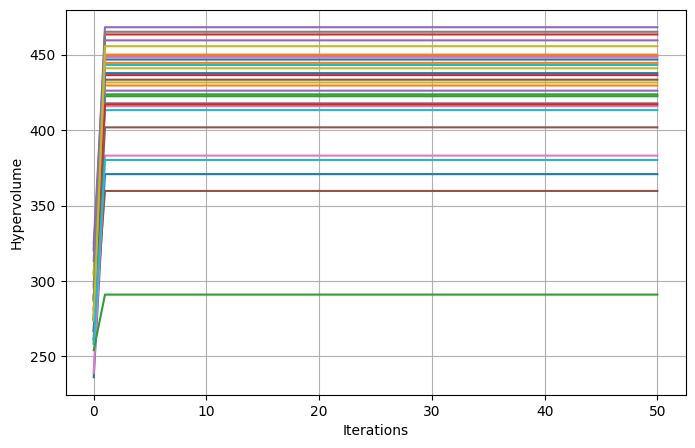

In [252]:
it=np.arange(51)
Sem=A1[1].unique()
HVs1=[]
for sem in Sem:
    hvs=A1[A1[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:10+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs1.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs1:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

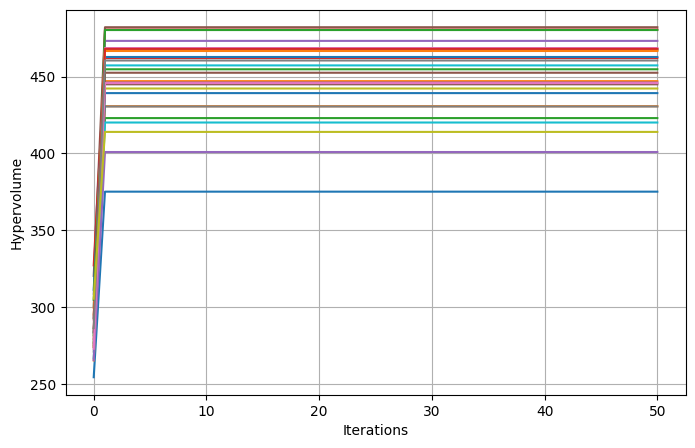

In [299]:
it=np.arange(51)
Sem=A2[1].unique()
HVs2=[]
for sem in Sem:
    hvs=A2[A2[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:20+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs2.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs2:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

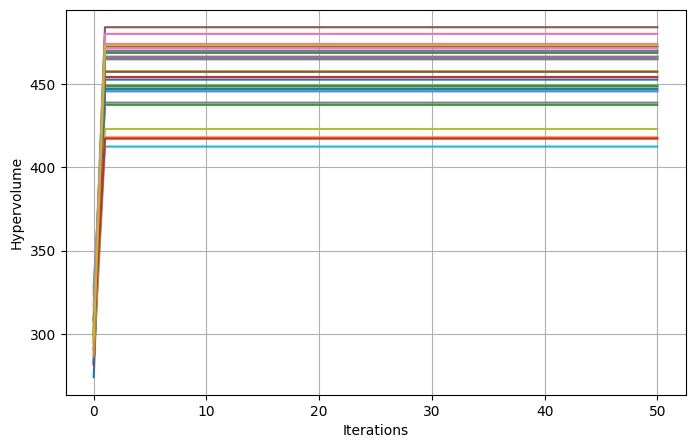

In [300]:
it=np.arange(51)
Sem=A3[1].unique()
HVs3=[]
for sem in Sem:
    hvs=A3[A3[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:30+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs3.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs3:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

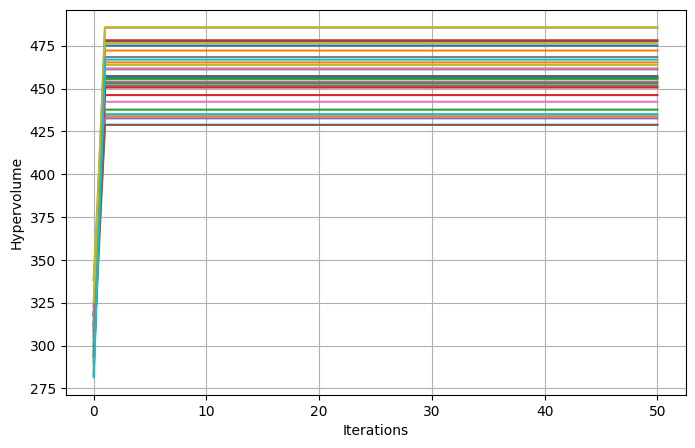

In [322]:
it=np.arange(51)
Sem=A4[1].unique()
HVs4=[]
for sem in Sem:
    hvs=A4[A4[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:40+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs4.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs4:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

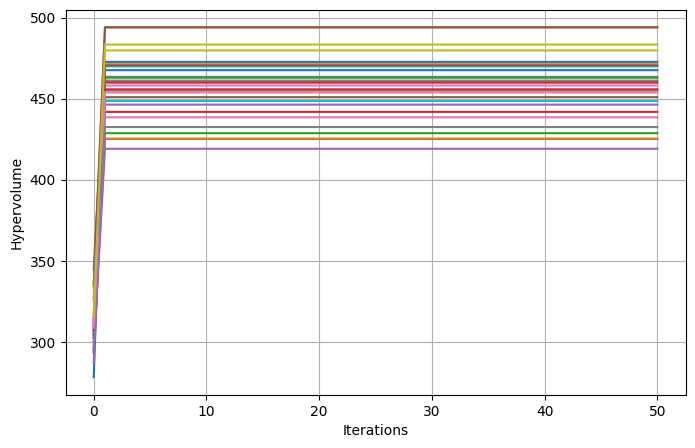

In [323]:
it=np.arange(51)
Sem=A5[1].unique()
HVs5=[]
for sem in Sem:
    hvs=A5[A5[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:50+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs5.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs5:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

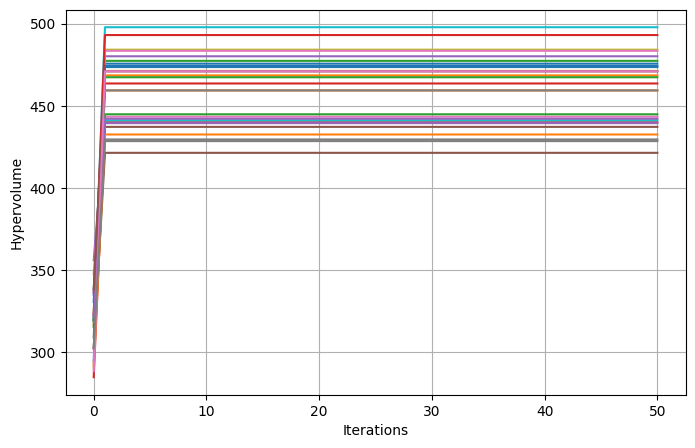

In [324]:
it=np.arange(51)
Sem=A6[1].unique()
HVs6=[]
for sem in Sem:
    hvs=A6[A6[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:60+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs6.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs6:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

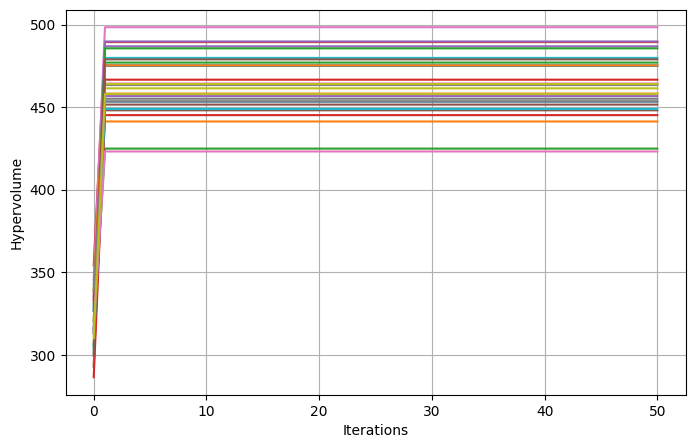

In [325]:
it=np.arange(51)
Sem=A7[1].unique()
HVs7=[]
for sem in Sem:
    hvs=A7[A7[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:70+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs7.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs7:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

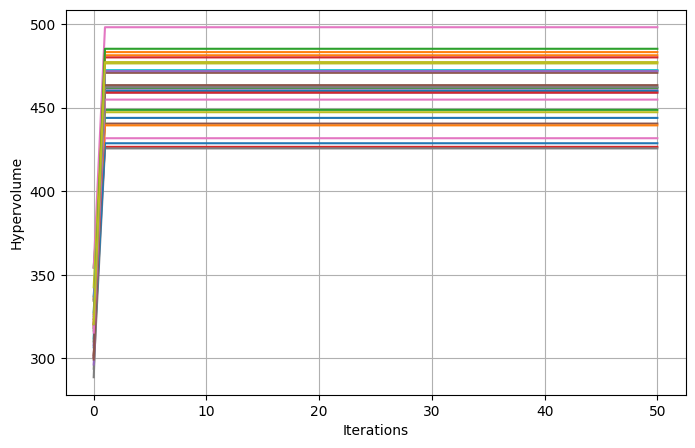

In [326]:
it=np.arange(51)
Sem=A8[1].unique()
HVs8=[]
for sem in Sem:
    hvs=A8[A8[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:80+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs8.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs8:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

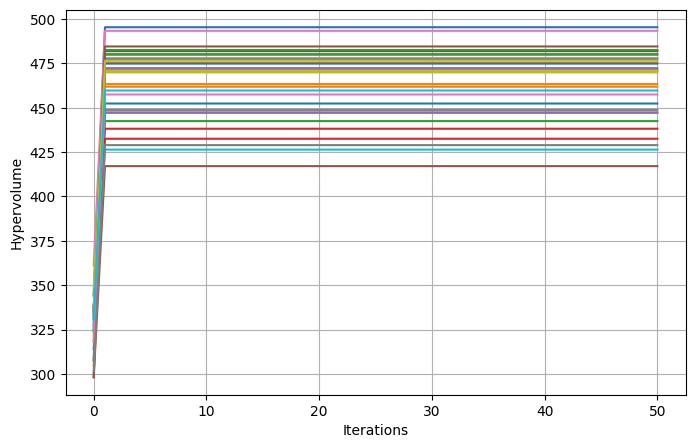

In [327]:
it=np.arange(51)
Sem=A9[1].unique()
HVs9=[]
for sem in Sem:
    hvs=A9[A9[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:90+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs9.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs9:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

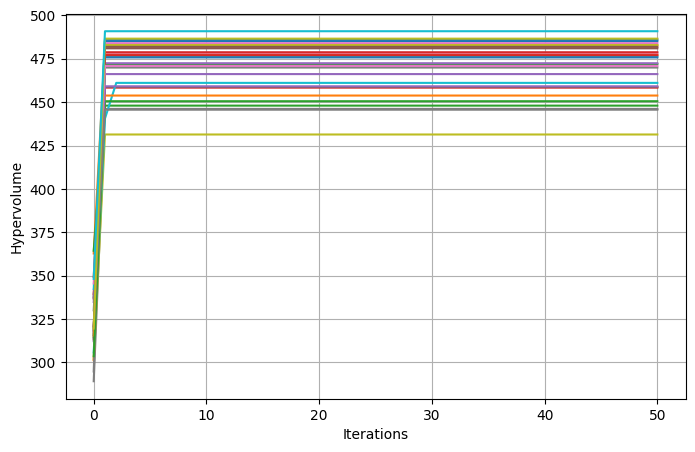

In [328]:
it=np.arange(51)
Sem=A10[1].unique()
HVs10=[]
for sem in Sem:
    hvs=A10[A10[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:90+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs10.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs10:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

In [163]:
len(A7[1].unique())

28

Text(0, 0.5, 'Hypervolume')

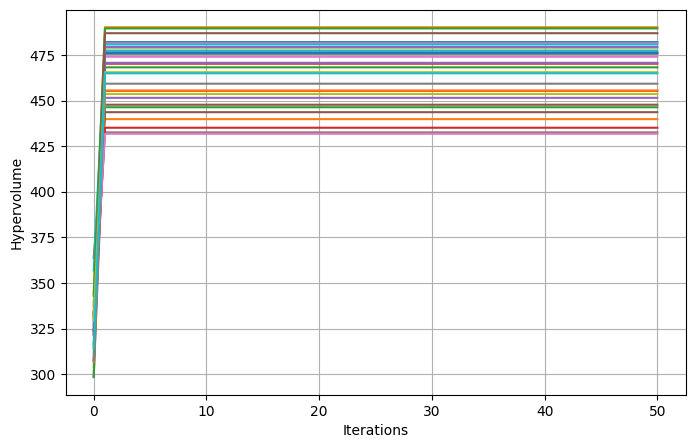

In [329]:
it=np.arange(51)
Sem=A11[1].unique()
HVs11=[]
for sem in Sem:
    hvs=A11[A11[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:110+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs11.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs11:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

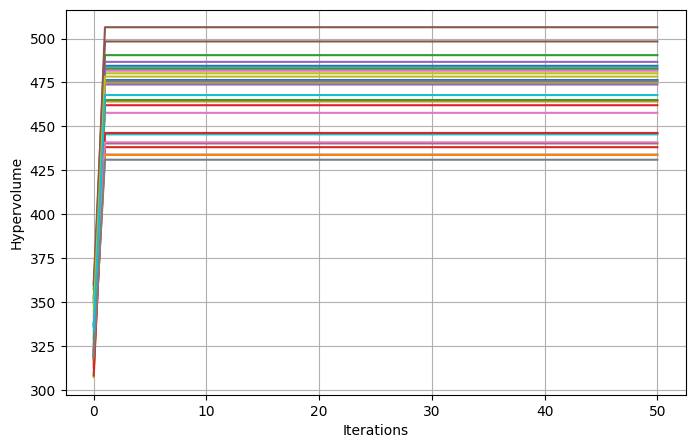

In [330]:
it=np.arange(51)
Sem=A12[1].unique()
HVs12=[]
for sem in Sem:
    hvs=A12[A12[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:120+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs12.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs12:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

In [378]:
filename = f"EXP_10N.pickle"
with open(filename, 'rb') as file:
            exp1N = pickle.load(file)
                
filename = f"EXP_20N.pickle"
with open(filename, 'rb') as file:
            exp2N = pickle.load(file)

filename = f"EXP_30N.pickle"
with open(filename, 'rb') as file:
            exp3N = pickle.load(file)
        
filename = f"EXP_40N.pickle"
with open(filename, 'rb') as file:
            exp4N = pickle.load(file)
                
filename = f"EXP_50N.pickle"
with open(filename, 'rb') as file:
            exp5N = pickle.load(file)

filename = f"EXP_60N.pickle"
with open(filename, 'rb') as file:
            exp6N = pickle.load(file)


In [379]:
A1N=pd.DataFrame(exp1N)
A2N=pd.DataFrame(exp2N)
A3N=pd.DataFrame(exp3N)
A4N=pd.DataFrame(exp4N)
A5N=pd.DataFrame(exp5N)
A6N=pd.DataFrame(exp6N)

Text(0, 0.5, 'Hypervolume')

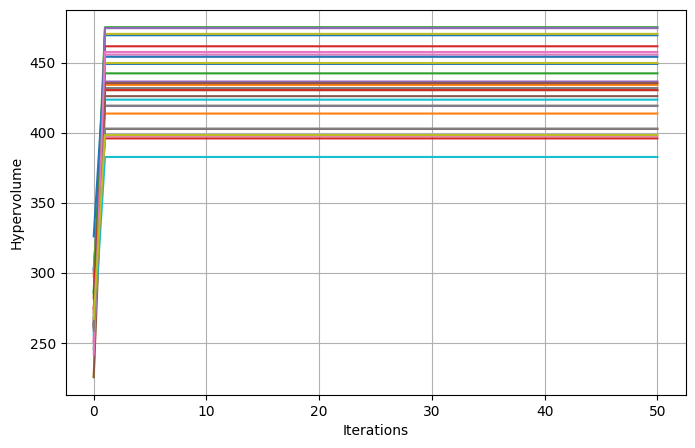

In [291]:
it=np.arange(51)
Sem=A1N[1].unique()
HVs1N=[]
for sem in Sem:
    hvs=A1N[A1N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:10+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs1N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs1N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

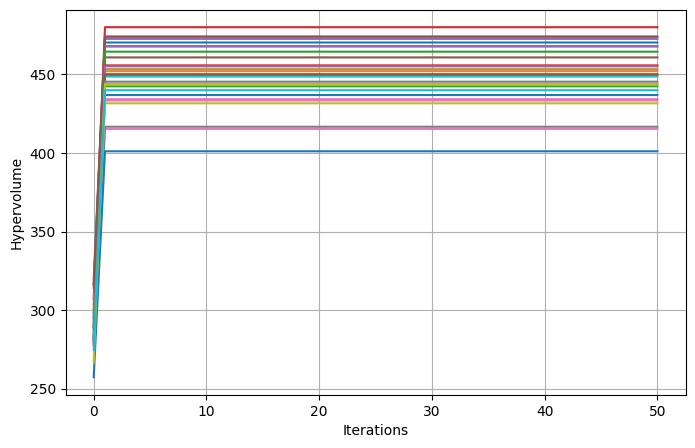

In [303]:
it=np.arange(51)
Sem=A2N[1].unique()
HVs2N=[]
for sem in Sem:
    hvs=A2N[A2N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:20+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs2N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs2N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

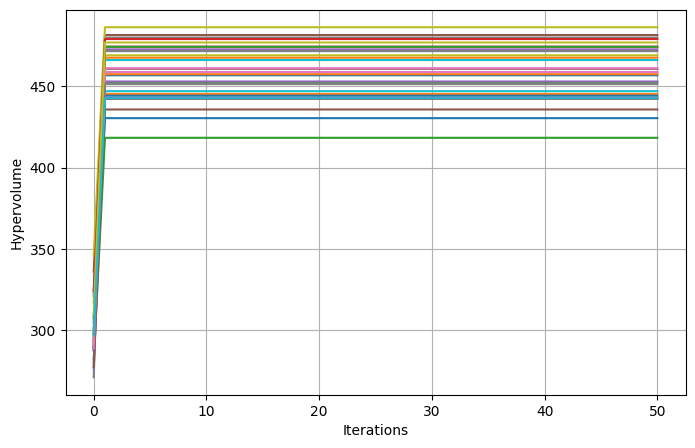

In [304]:
it=np.arange(51)
Sem=A3N[1].unique()
HVs3N=[]
for sem in Sem:
    hvs=A3N[A3N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:30+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs3N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs3N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

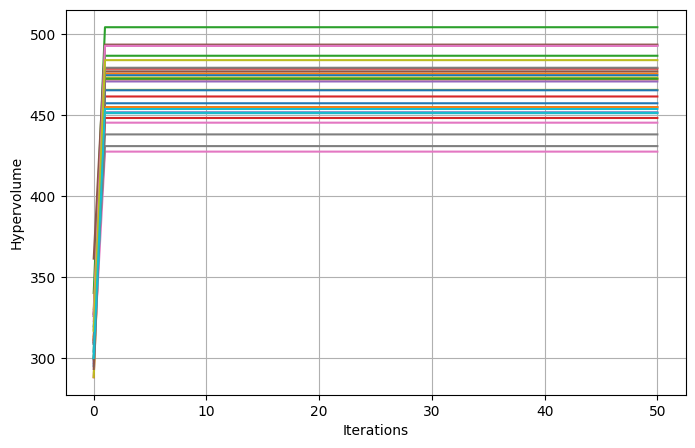

In [337]:
it=np.arange(51)
Sem=A4N[1].unique()
HVs4N=[]
for sem in Sem:
    hvs=A4N[A4N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:40+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs4N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs4N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

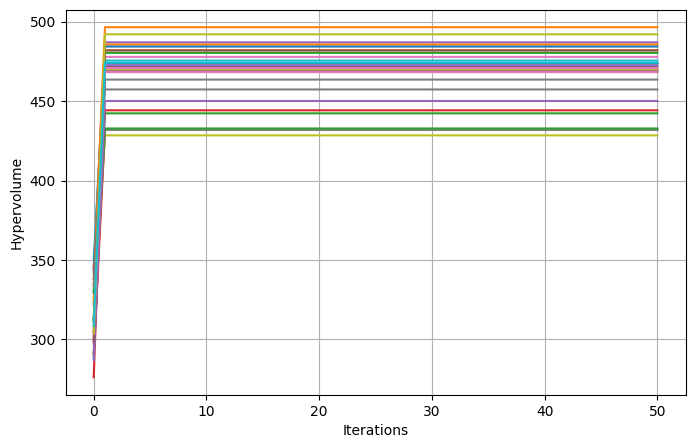

In [338]:
it=np.arange(51)
Sem=A5N[1].unique()
HVs5N=[]
for sem in Sem:
    hvs=A5N[A5N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:50+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs5N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs5N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

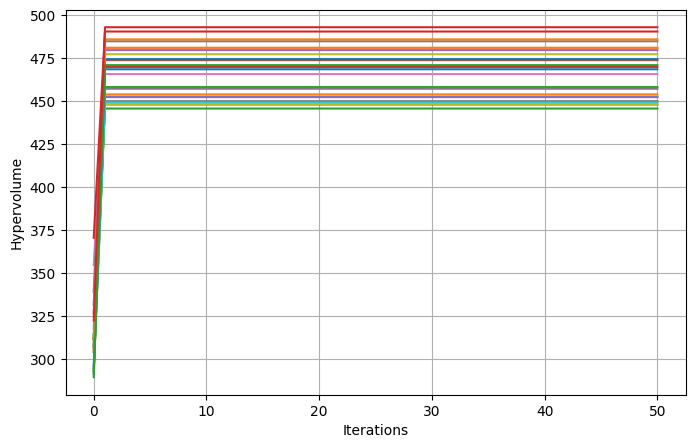

In [380]:
it=np.arange(51)
Sem=A6N[1].unique()
HVs6N=[]
for sem in Sem:
    hvs=A6N[A6N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:60+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs6N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs6N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

Text(0, 0.5, 'Hypervolume')

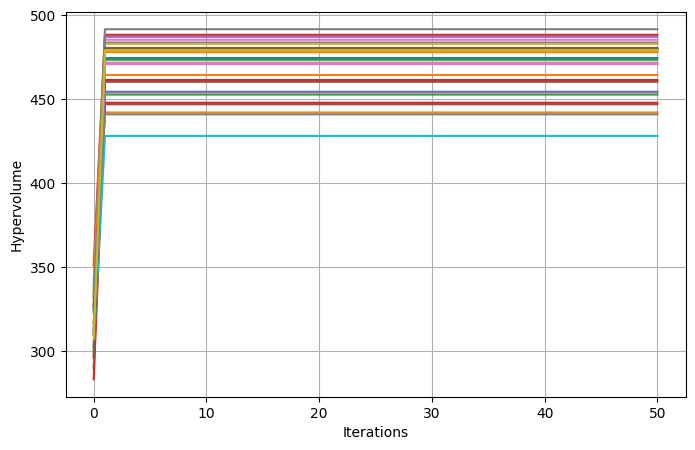

In [69]:
it=np.arange(51)
Sem=A7N[1].unique()
HVs7N=[]
for sem in Sem:
    hvs=A7N[A7N[1]==sem]
    hhh=[]
    for i in range(51):
        bd = FastNondominatedPartitioning(ref_point=problem.ref_point, Y=np.array(hvs[6])[49][:70+50*i])
        volume = bd.compute_hypervolume().item()
        hhh.append(volume)
    HVs7N.append(hhh)
    
plt.figure(figsize=(8,5))
for hvs in HVs7N:
    plt.plot(it, hvs)
plt.grid()
plt.xlabel('Iterations', fontsize=10)
plt.ylabel('Hypervolume', fontsize=10)

In [171]:
import seaborn as sns

In [331]:
HVs=[HVs1, HVs2, HVs3, HVs4, HVs5, HVs6, HVs7, HVs8, HVs9, HVs10, HVs11, HVs12]

HVo=[]
for hvs in HVs:
    HERE=[]
    for j in range(28):
        k=np.round(hvs[j][-1],2)
        HERE.append(k)
    HVo.append(HERE)
    
HVo=np.array(HVo)
HVss1=pd.DataFrame({'10':HVo[0], '20':HVo[1],'30':HVo[2],'40':HVo[3],'50':HVo[4],
                 '60':HVo[5],'70':HVo[6],'80':HVo[7],'90':HVo[8],
                    '100':HVo[9], '110':HVo[10], '120':HVo[11], 'AF':'qEHVI'})


In [332]:
HV=pd.concat([HVss1], ignore_index=True)
HV = pd.melt(HV,id_vars='AF',value_vars=['10','20','30','40','50','60','70','80','90', '100', '110', '120'],
             var_name='IS', value_name='HyVo')


In [333]:
HV['IS'] = HV['IS'].astype(int)
HV

,AF,IS,HyVo
0,qEHVI,10,370.79
1,qEHVI,10,429.49
2,qEHVI,10,423.64
3,qEHVI,10,463.35
4,qEHVI,10,459.44
...,...,...,...
331,qEHVI,120,446.31
332,qEHVI,120,486.74
333,qEHVI,120,498.35
334,qEHVI,120,440.96


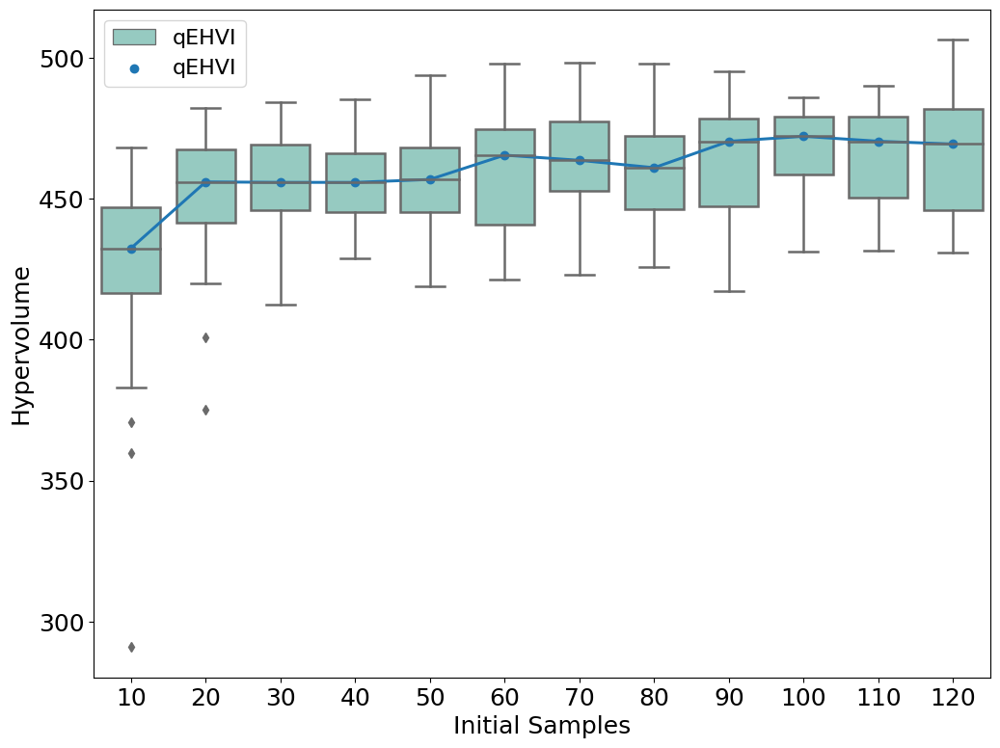

In [334]:
m=HV.groupby('IS')['HyVo'].median()

x_values = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150]

plt.figure(figsize=(12,9)) #for a bigger image
sns.boxplot(x="IS", y="HyVo", hue="AF", data=HV, palette="Set3", linewidth=1.8, order=range(10, 130, 10))
sns.pointplot(x='IS', y='HyVo',hue='AF' ,data=HV,estimator='median', scale=0.8, errwidth=0, order=range(10, 130, 10))

plt.xlabel('Initial Samples', fontsize=18)
plt.ylabel('Hypervolume', fontsize=18)
#plt.ylim([350,600])

plt.tick_params(axis='x', which='major', labelsize=18)
plt.tick_params(axis='y', which='major', labelsize=18)
plt.legend(fontsize=16)

#plt.show()
plt.savefig('HyVop.png')

In [240]:
HVsN=[HVs2N, HVs3N, HVs4N, HVs5N, HVs6N, HVs7N]

HVoN=[]
for hvs in HVsN:
    HERE=[]
    for j in range(28):
        k=np.round(hvs[j][-1],2)
        HERE.append(k)
    HVoN.append(HERE)
    
HVoN=np.array(HVo1)
HVss=pd.DataFrame({'20':HVoN[0],'30':HVoN[1],'40':HVoN[2],'50':HVoN[3],
                 '60':HVoN[4],'70':HVoN[5], 'AF':'qNEHVI'})

In [246]:
HV=pd.concat([HVss, HVss1[['20','30','40','50','60','70','AF']]], ignore_index=True)
HV = pd.melt(HV,id_vars='AF',value_vars=['20','30','40','50','60','70'],
             var_name='IS', value_name='HyVo')

In [247]:
HV['IS'] = HV['IS'].astype(int)
HV

,AF,IS,HyVo
0,qNEHVI,20,463.19
1,qNEHVI,20,474.33
2,qNEHVI,20,477.99
3,qNEHVI,20,392.10
4,qNEHVI,20,466.01
...,...,...,...
331,qEHVI,70,429.66
332,qEHVI,70,449.60
333,qEHVI,70,464.86
334,qEHVI,70,422.92


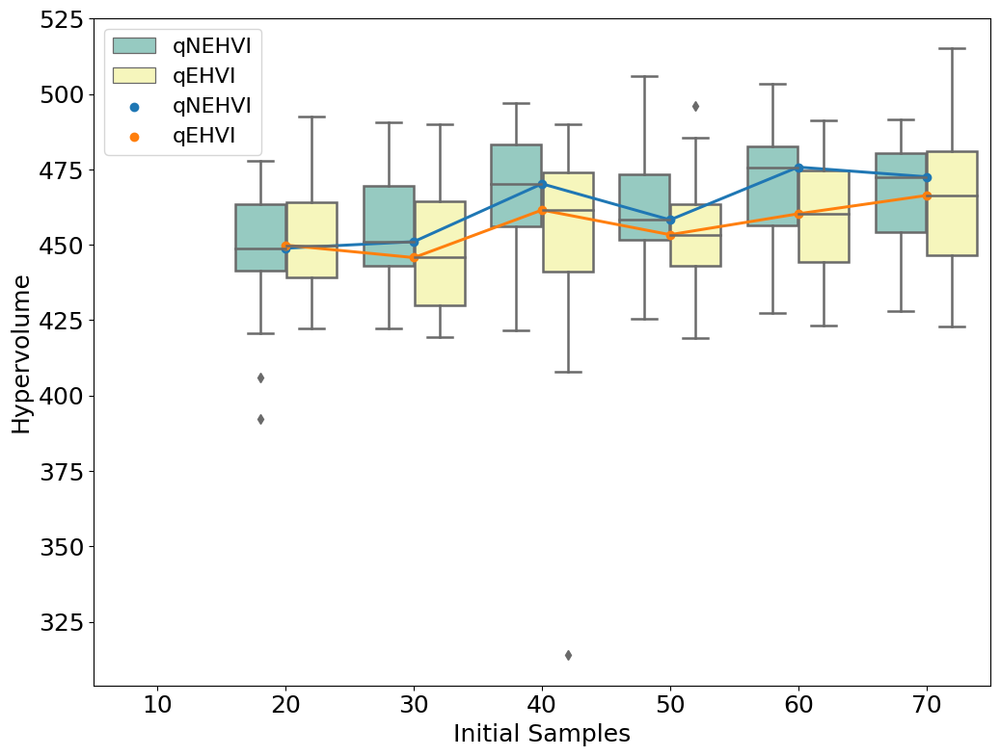

In [248]:
m=HV.groupby('IS')['HyVo'].median()

x_values = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150]

plt.figure(figsize=(12,9)) #for a bigger image
sns.boxplot(x="IS", y="HyVo", hue="AF", data=HV, palette="Set3", linewidth=1.8, order=range(10, 80, 10))
sns.pointplot(x='IS', y='HyVo',hue='AF' ,data=HV,estimator='median', scale=0.8, errwidth=0, order=range(10, 80, 10))

plt.xlabel('Initial Samples', fontsize=18)
plt.ylabel('Hypervolume', fontsize=18)
#plt.ylim([350,600])

plt.tick_params(axis='x', which='major', labelsize=18)
plt.tick_params(axis='y', which='major', labelsize=18)
plt.legend(fontsize=16)

#plt.show()
plt.savefig('HyVop.png')

In [243]:
HVss1[['20','30','40','50','60','70']

SyntaxError: incomplete input (739676771.py, line 1)

In [196]:
HVss1

,10,20,30,40,50,60,70,80,90,100,110,120,AF
0,349.43,452.31,441.56,443.02,453.34,476.38,515.17,471.47,442.87,488.32,480.41,482.44,qNEHVI
1,436.07,423.23,460.17,435.29,459.73,480.60,478.03,480.85,441.88,457.75,479.81,510.72,qNEHVI
2,426.49,455.65,430.30,478.50,452.86,469.88,430.03,455.88,468.48,478.03,475.15,482.43,qNEHVI
3,483.36,438.89,462.17,474.68,422.27,463.58,467.59,465.38,462.98,438.14,429.41,493.05,qNEHVI
4,423.32,452.99,419.50,421.13,480.07,433.27,456.85,466.24,480.19,467.15,491.43,479.78,qNEHVI
5,478.72,439.35,428.70,420.64,455.54,460.79,455.52,470.23,467.71,486.93,476.44,473.90,qNEHVI
6,445.48,462.66,487.56,408.06,446.53,450.36,465.96,474.13,475.72,478.58,466.02,469.00,qNEHVI
7,388.63,422.68,468.63,443.08,485.44,489.99,486.25,442.58,480.65,475.80,469.62,477.09,qNEHVI
8,430.46,449.85,442.08,468.56,419.16,476.67,466.79,467.03,470.46,481.56,444.98,463.61,qNEHVI
9,468.35,455.24,474.56,484.80,477.86,459.80,481.09,431.35,465.43,448.30,476.08,486.23,qNEHVI


In [245]:
HVss

,20,30,40,50,60,70,AF
0,463.19,453.92,476.89,476.28,483.98,454.40,qNEHVI
1,474.33,450.05,482.53,425.36,458.45,464.39,qNEHVI
2,477.99,445.65,469.20,458.14,476.56,452.71,qNEHVI
3,392.10,480.63,432.41,426.68,427.41,488.32,qNEHVI
4,466.01,444.62,469.86,484.90,480.43,483.70,qNEHVI
5,463.79,451.57,470.63,430.14,433.87,446.90,qNEHVI
6,430.08,425.37,491.73,468.83,503.58,485.37,qNEHVI
7,450.44,450.54,456.27,465.64,483.09,480.36,qNEHVI
8,457.47,453.44,465.22,430.32,459.32,482.90,qNEHVI
9,437.61,442.53,435.17,456.89,440.66,479.40,qNEHVI


In [381]:
HVs=[HVs1, HVs2, HVs3, HVs4, HVs5, HVs6]

HVo=[]
for hvs in HVs:
    HERE=[]
    for j in range(28):
        k=np.round(hvs[j][-1],2)
        HERE.append(k)
    HVo.append(HERE)
    
HVo=np.array(HVo)
HVss1=pd.DataFrame({'10':HVo[0],'20':HVo[1],'30':HVo[2],'40':HVo[3],'50':HVo[4], '60':HVo[5], 'AF':'qEHVI'})

In [382]:
HVsN=[HVs1N, HVs2N, HVs3N, HVs4N, HVs5N, HVs6N]

HVoN=[]
for hvs in HVsN:
    HERE=[]
    for j in range(18):
        k=np.round(hvs[j][-1],2)
        HERE.append(k)
    HVoN.append(HERE)
    
HVoN=np.array(HVoN)
HVss=pd.DataFrame({'10':HVoN[0], '20':HVoN[1],'30':HVoN[2], '40':HVoN[3], '50':HVoN[4], '60':HVoN[5], 'AF':'qNEHVI'})

In [389]:
HV=pd.concat([HVss, HVss1], ignore_index=True)
HV = pd.melt(HV,id_vars='AF',value_vars=['10', '20','30', '40', '50'],
             var_name='IS', value_name='HyVo')

In [390]:
HV['IS'] = HV['IS'].astype(int)
HV

,AF,IS,HyVo
0,qNEHVI,10,469.49
1,qNEHVI,10,413.60
2,qNEHVI,10,430.33
3,qNEHVI,10,395.85
4,qNEHVI,10,418.99
...,...,...,...
225,qEHVI,50,455.68
226,qEHVI,50,446.27
227,qEHVI,50,470.45
228,qEHVI,50,453.95


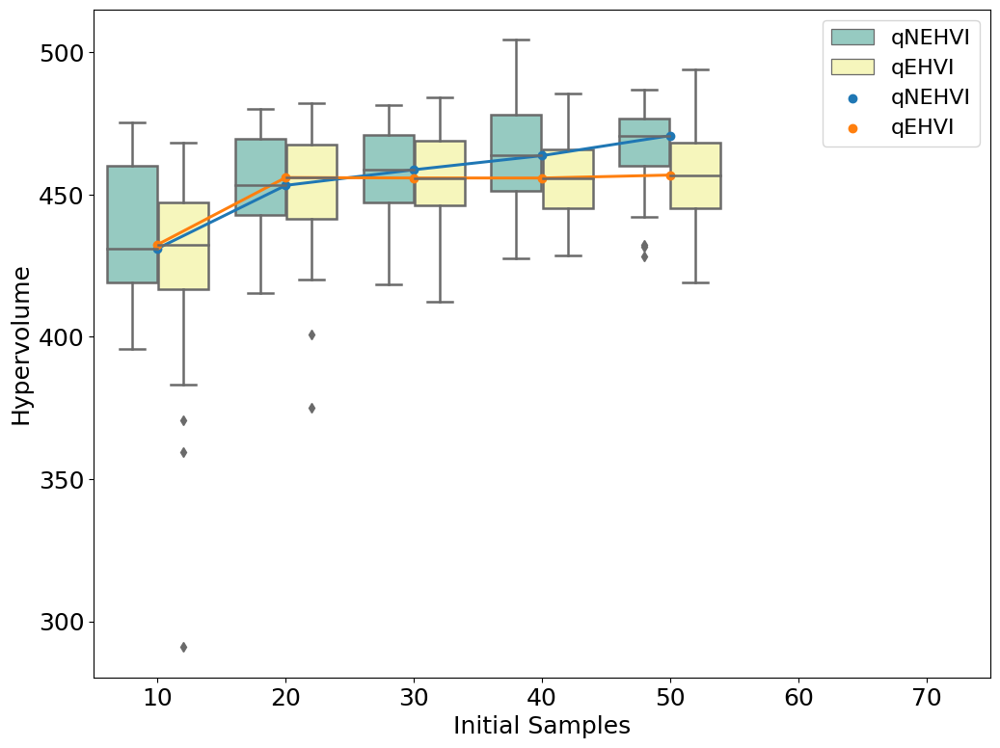

In [391]:
m=HV.groupby('IS')['HyVo'].median()

x_values = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 150]

plt.figure(figsize=(12,9)) #for a bigger image
sns.boxplot(x="IS", y="HyVo", hue="AF", data=HV, palette="Set3", linewidth=1.8, order=range(10, 80, 10))
sns.pointplot(x='IS', y='HyVo',hue='AF' ,data=HV,estimator='median', scale=0.8, errwidth=0, order=range(10, 80, 10))

plt.xlabel('Initial Samples', fontsize=18)
plt.ylabel('Hypervolume', fontsize=18)
#plt.ylim([350,600])

plt.tick_params(axis='x', which='major', labelsize=18)
plt.tick_params(axis='y', which='major', labelsize=18)
plt.legend(fontsize=16)

#plt.show()
plt.savefig('HyVop.png')

In [408]:
filename = f"EXP_20.pickle"
with open(filename, 'rb') as file:
            exp2N = pickle.load(file)

In [409]:
exp2N

[[20,
  955,
  422.77208522151153,
  11,
  tensor([[-159.2230,    1.4176,   13.9891],
          [-158.0595,    1.3340,   13.9925],
          [-157.6349,    1.3021,   14.0850],
          [-155.5540,    1.1158,   14.2074],
          [-157.5043,    1.1992,   14.0866],
          [-157.0969,    1.3264,   13.9705],
          [-162.8267,    1.2921,   14.1869],
          [-155.3322,    1.1429,   14.1083],
          [-158.6386,    1.2914,   14.3237],
          [-155.4045,    1.2733,   14.0548],
          [-145.7547,    0.9501,   14.3976]], dtype=torch.float64),
  tensor([[1.3203e-01, 2.2202e-01, 9.8185e-02, 9.7828e-03, 2.7173e-02, 1.7966e-01,
           1.1543e-02, 3.2066e-02, 3.1165e-02, 3.8680e-03, 1.3371e-02, 7.1460e-03,
           1.2061e-02, 4.1040e-02, 5.2579e-02, 1.2031e-01, 5.9953e-03],
          [1.3229e-01, 2.2464e-01, 9.2977e-02, 9.6017e-03, 2.6158e-02, 1.7861e-01,
           1.0701e-02, 3.3657e-02, 3.2529e-02, 3.5219e-03, 1.3775e-02, 6.4658e-03,
           1.1642e-02, 4.2517e-02, 5.

In [ ]:
en.